<h1 style='text-align:center;color:red;'>In the name of God</h1>

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


> Note that if any problem happend in running this project use this steps:
> 1.Check to have libraries with the same version used in this project
> 2.You can also search your problem on the browser

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# Let's install requires version of requirements
!pip install -qq tensorflow[and-cuda]==2.15.0 tf-keras~=2.15.0 tensorflow_hub tensorrt-libs==8.6.1 --extra-index-url https://pypi.nvidia.com


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.8/824.8 MB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.8/417.8 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 166.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 166.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.4/23.4 MB 158.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 845.8/845.8 kB 205.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.1/720.1 MB 46.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 103.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 130.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.9/124.9 MB 100.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.3/195.3 MB 66.9 MB/s eta 0:00:00
     ━━━━━

In [1]:
# Tensorflow version must be 2.15.0 for this project
import tensorflow as tf
tf.__version__

'2.15.0'

In [2]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [3]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mplt
import sklearn

In [4]:
# Let's print our libraries version
print(f'numpy version: {np.__version__}\npandas version: {pd.__version__}\nmatplotlib version:{mplt.__version__}\nsklearn version:{sklearn.__version__}')

numpy version: 1.26.4
pandas version: 2.2.2
matplotlib version:3.10.0
sklearn version:1.6.1


In [5]:
# 223

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

In [7]:
# lets extract our data
# !unzip "drive/My Drive/data-project3/archive_3.zip" -d "drive/My Drive/data-project3/"

In [8]:
# Run this cell if TensorFlow 2.x isn't the default in Colab
try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [18]:
# load data:
df = pd.read_csv('drive/MyDrive/data-project3/sample_submission.csv')
df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,ffeda8623d4eee33c6d1156a2ecbfcf8,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10353,fff1ec9e6e413275984966f745a313b0,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10354,fff74b59b758bbbf13a5793182a9bbe4,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10355,fff7d50d848e8014ac1e9172dc6762a3,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [19]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
id,000621fb3cbb32d8935728e48679680e,00102ee9d8eb90812350685311fe5890,0012a730dfa437f5f3613fb75efcd4ce,001510bc8570bbeee98c8d80c8a95ec1,001a5f3114548acdefa3d4da05474c2e,00225dcd3e4d2410dd53239f95c0352f,002c2a3117c2193b4d26400ce431eebd,002c58d413a521ae8d1a5daeb35fc803,002f80396f1e3db687c5932d7978b196,0036c6bcec6031be9e62a257b1c3c442
affenpinscher,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
afghan_hound,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
african_hunting_dog,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
airedale,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
...,...,...,...,...,...,...,...,...,...,...
welsh_springer_spaniel,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
west_highland_white_terrier,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
whippet,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
wire-haired_fox_terrier,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [11]:
# import tensorflow hub and check its version
import tensorflow_hub as hub
print(f'tensorflow hub version: {hub.__version__}')

# check having gpu by command:
print('Access to GPU is ok!' if tf.config.list_physical_devices("GPU") else 'Access is\'nt available')

# access colab gpu by change runtime type from runtime menu


tensorflow hub version: 0.16.1
Access to GPU is ok!


In [12]:
# 226

In [20]:
#load labels
labels = pd.read_csv('drive/MyDrive/data-project3/labels.csv')
labels

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


# Getting our data ready:

In [21]:
# describe labels and get head
print(labels.head(), labels.describe(), sep='\n')

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [22]:
# how many images are there of each breed
labels['breed'].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


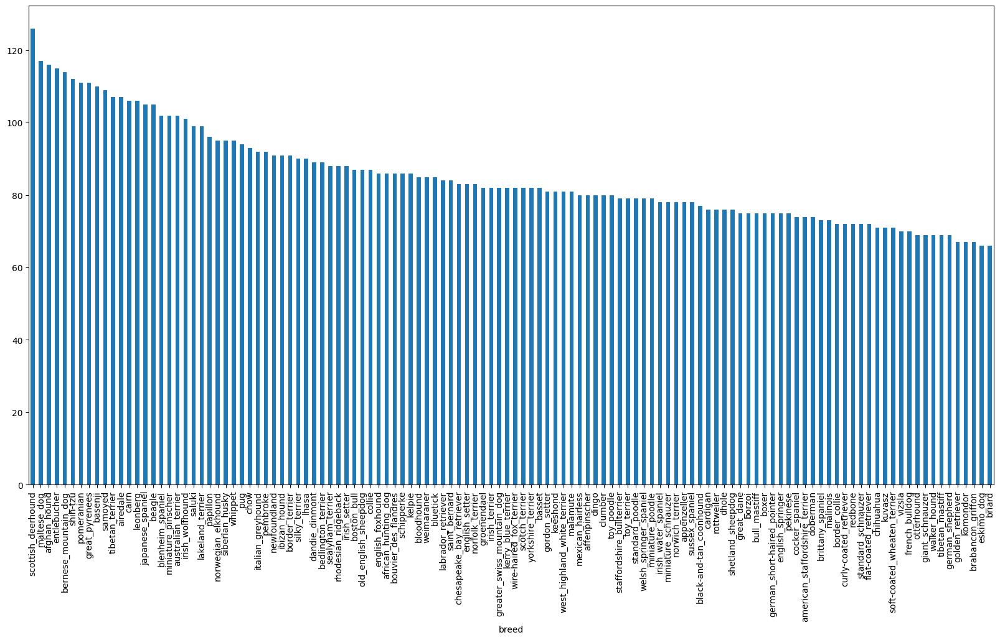

In [23]:
# let's visualize it
labels['breed'].value_counts().plot.bar(figsize=(20, 10));

In [24]:
# we searched about minimom number of photos of each breed and found out that we need at least 10 photos per breed
labels['breed'].value_counts().median()

82.0

In [25]:
labels['breed'].value_counts().mean()

85.18333333333334

In [26]:
labels.head(5)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


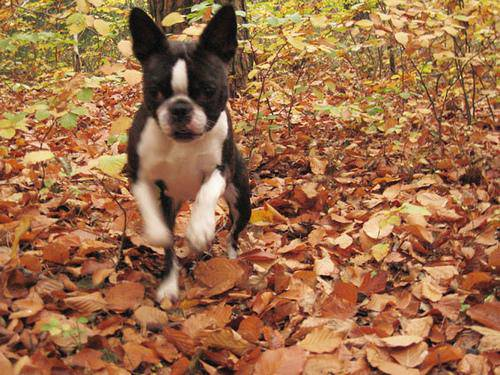

In [27]:
# Lets view an image
from IPython.display import Image
Image('drive/MyDrive/data-project3/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [28]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [29]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/data-project3/train/" + fname + ".jpg" for fname in labels["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/data-project3/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/data-project3/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/data-project3/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/data-project3/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/data-project3/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/data-project3/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/data-project3/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/data-project3/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/data-project3/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/data-project3/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

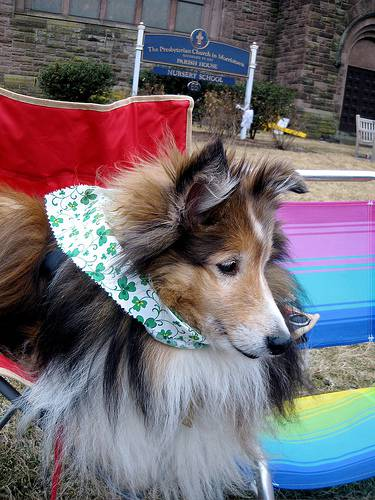

In [30]:
Image(filenames[10])

In [31]:
labels['breed'][10]

'shetland_sheepdog'

In [32]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/data-project3/train/')) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


This dog is a/an doberman dog


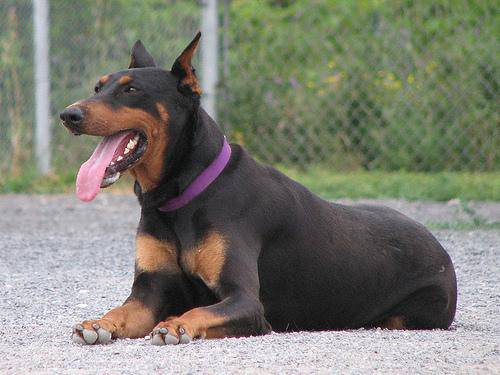

In [33]:
# One more check
print(f'This dog is a/an {labels["breed"][20]} dog')
Image(filenames[20])

In [34]:
labels_csv = pd.read_csv('drive/MyDrive/data-project3/labels.csv')
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [35]:
unique_breeds = np.unique(labels)
print(f'We have {len(unique_breeds)} unique breeds\n\n list of them: {unique_breeds}')

We have 120 unique breeds

 list of them: ['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_

In [36]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [37]:
len(labels)

10222

In [38]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [39]:
# Example: Turning boolean array into integers
print(labels[2]) # original label
print(boolean_labels[2].argmax()) # index where label occurs
print(np.where(labels[2] == unique_breeds))  # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs


print(labels[0])
print(boolean_labels[0].argmax())
print(np.where(labels[0] == unique_breeds))
print(boolean_labels[0].astype(int))

pekinese
85
(array([85]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
boston_bull
19
(array([19]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [40]:
filenames[:10]

['drive/MyDrive/data-project3/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/data-project3/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/data-project3/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/data-project3/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/data-project3/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/data-project3/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/data-project3/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/data-project3/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/data-project3/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/data-project3/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [41]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [42]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [44]:
# Set number of images to use for experimenting
ImageNumber = 5000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [45]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(X[:ImageNumber], y[:ImageNumber], test_size=0.2, random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(4000, 4000, 1000, 1000)

In [46]:
# Let's have a geez at the training data
x_train[:5], y_train[:2]

(['drive/MyDrive/data-project3/train/693f4cd00978df07e1283d3da4d02e0c.jpg',
  'drive/MyDrive/data-project3/train/7521421e092333c78d6b9dc2e189e659.jpg',
  'drive/MyDrive/data-project3/train/13d42ef52eb6c649c14cb9ffa8b6fba4.jpg',
  'drive/MyDrive/data-project3/train/5b93fe30e02f555ff6c3ae5e050dd752.jpg',
  'drive/MyDrive/data-project3/train/685cda6503bd2f2d282d7e9b7ceb33c5.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [47]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[24])
image.shape

(280, 200, 3)

array([[[  0,   4,   0],
        [  0,   9,   3],
        [  2,  11,   6],
        ...,
        [  0,  13,   4],
        [ 12,  25,  16],
        [  0,   5,   0]],

       [[  0,   9,   3],
        [  7,  18,  12],
        [ 14,  23,  18],
        ...,
        [ 23,  36,  27],
        [ 34,  47,  38],
        [ 10,  23,  14]],

       [[  0,  10,   4],
        [  9,  20,  14],
        [ 17,  26,  21],
        ...,
        [ 17,  33,  23],
        [ 27,  43,  33],
        [  1,  17,   7]],

       ...,

       [[  0,   1,   0],
        [  5,   7,   2],
        [  9,  11,   6],
        ...,
        [ 71,  84,  77],
        [ 89, 104,  99],
        [ 30,  45,  38]],

       [[  6,   8,   3],
        [ 11,  13,   8],
        [ 13,  15,  10],
        ...,
        [121, 130, 127],
        [107, 117, 116],
        [ 15,  27,  23]],

       [[  1,   3,   0],
        [  6,   8,   3],
        [  6,   8,   3],
        ...,
        [ 19,  28,  27],
        [ 41,  50,  49],
        [  0,   5,   4]]], dtype=uint8)
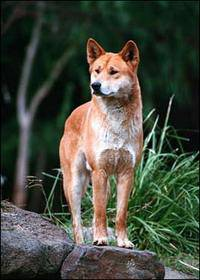

In [48]:
image

In [49]:
image[:2]

array([[[ 0,  4,  0],
        [ 0,  9,  3],
        [ 2, 11,  6],
        ...,
        [ 0, 13,  4],
        [12, 25, 16],
        [ 0,  5,  0]],

       [[ 0,  9,  3],
        [ 7, 18, 12],
        [14, 23, 18],
        ...,
        [23, 36, 27],
        [34, 47, 38],
        [10, 23, 14]]], dtype=uint8)

In [50]:
image.max(), image.min()

(255, 0)

In [51]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 200, 3), dtype=uint8, numpy=
array([[[ 0,  4,  0],
        [ 0,  9,  3],
        [ 2, 11,  6],
        ...,
        [ 0, 13,  4],
        [12, 25, 16],
        [ 0,  5,  0]],

       [[ 0,  9,  3],
        [ 7, 18, 12],
        [14, 23, 18],
        ...,
        [23, 36, 27],
        [34, 47, 38],
        [10, 23, 14]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [52]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [53]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [54]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [55]:
print(tf.constant(X[:2]), tf.constant(y[:2]), sep='\n', end='\n')
print(tf.constant(x_train[:2]), tf.constant(y_train[:2]), sep='\n', end='\n')

tf.Tensor(
[b'drive/MyDrive/data-project3/train/000bec180eb18c7604dcecc8fe0dba07.jpg'
 b'drive/MyDrive/data-project3/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'], shape=(2,), dtype=string)
tf.Tensor(
[[False False False False False False False False False False False False
  False False False False False False False  True False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False False False False False False False False False]
 [False False False False False False False False False Fal

In [56]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_bathes(X, y=None, batch_size=BATCH_SIZE, validation_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print('creating test data batches')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif validation_data:
    print('creating validation data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch



  else:
    print('creating training data batches')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data_shuffled = data.shuffle(len(X))
    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data_map = data_shuffled.map(get_image_label)
    # Turn the training data into batches
    data_batch = data_map.batch(batch_size)
    return data_batch


In [57]:
# Create training and validation data batches
train_data = create_data_bathes(x_train, y_train)
val_data = create_data_bathes(x_val, y_val, validation_data=True)

creating training data batches
creating validation data batches


In [58]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [59]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [60]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

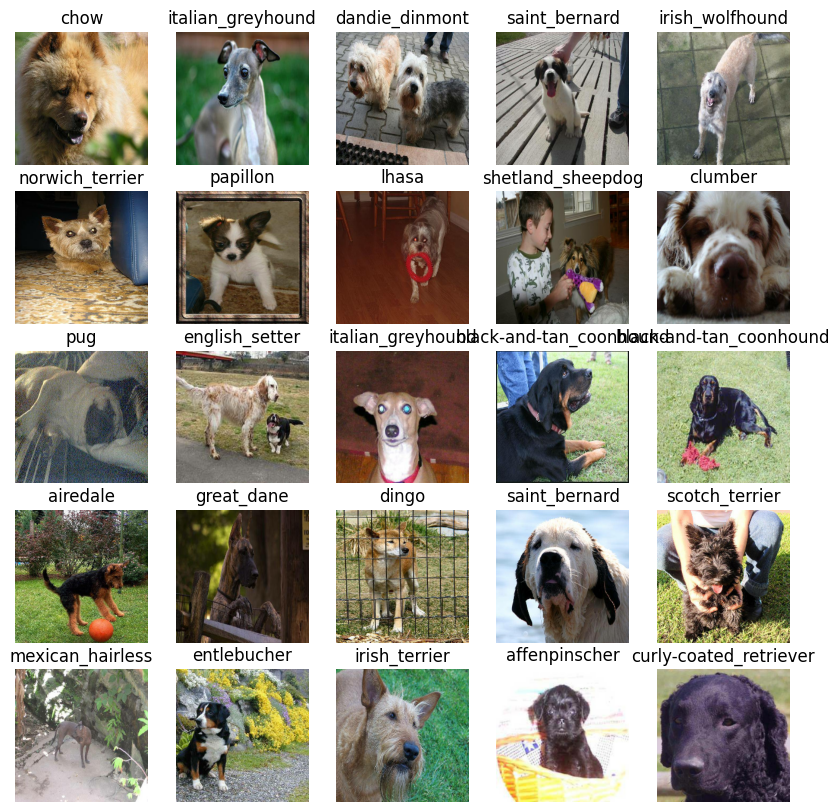

In [61]:
# because our data is batch, we have to unbatch it to plot and then we are gonna make our data iterating by next
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [62]:
IMG_SIZE

224

In [63]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [64]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [65]:
import tf_keras
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  # We will use Sequential keras for creating our model
  # Setup the model layers
  model = tf.keras.Sequential([
      # Layer1: input layer
      hub.KerasLayer(model_url),
      # Layer2: output layer
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax")

  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(input_shape)

  return model

### Loss: it's a measure of how well the model is guessing, the higher loss the worst prediction is and reverse!
### You can use another metrics, search keras metrics
### If you wanna know what activation you should use in instantiating Dense, look at this picture:

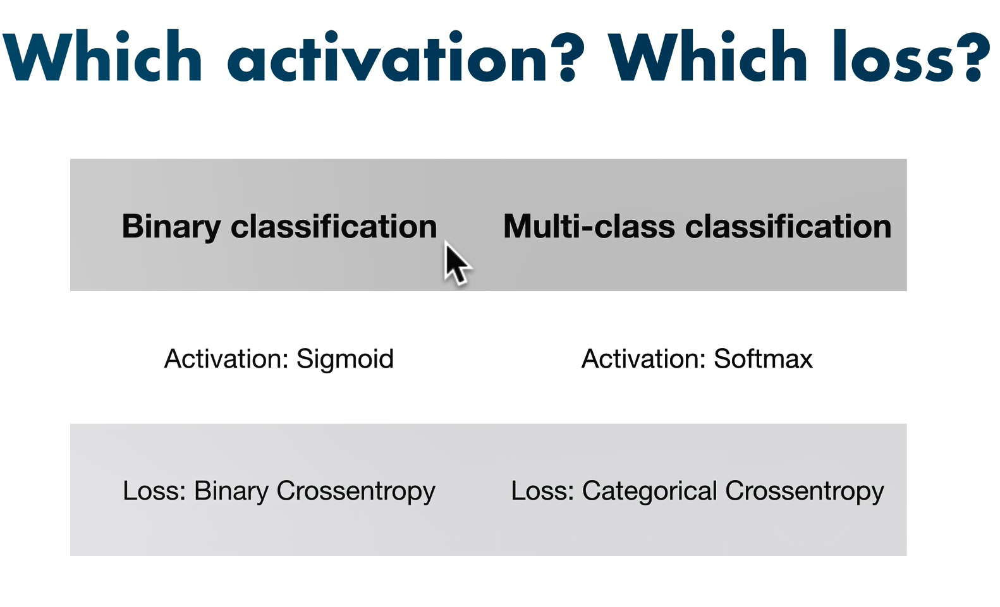

In [66]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [67]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [68]:
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/data-project3/logs',
                                                # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [69]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)


## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [70]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [71]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [72]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [73]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [75]:
# Fit the model to the data
model = train_model()

Epoch 1/100
125/125 [==============================] - 1942s 15s/step - loss: 2.2264 - accuracy: 0.5090 - val_loss: 0.9187 - val_accuracy: 0.7440
Epoch 2/100
125/125 [==============================] - 21s 170ms/step - loss: 0.4746 - accuracy: 0.8832 - val_loss: 0.7548 - val_accuracy: 0.7800
Epoch 3/100
125/125 [==============================] - 23s 181ms/step - loss: 0.2445 - accuracy: 0.9505 - val_loss: 0.7283 - val_accuracy: 0.7830
Epoch 4/100
125/125 [==============================] - 22s 175ms/step - loss: 0.1455 - accuracy: 0.9795 - val_loss: 0.7184 - val_accuracy: 0.7870
Epoch 5/100
125/125 [==============================] - 22s 174ms/step - loss: 0.0958 - accuracy: 0.9910 - val_loss: 0.7014 - val_accuracy: 0.7880
Epoch 6/100
125/125 [==============================] - 23s 187ms/step - loss: 0.0675 - accuracy: 0.9952 - val_loss: 0.6997 - val_accuracy: 0.7850
Epoch 7/100
125/125 [==============================] - 24s 191ms/step - loss: 0.0500 - accuracy: 0.9987 - val_loss: 0.7044 -

In [78]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/data-project3/models",
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s')
                          )
  model_path = modeldir + '-' + suffix + '.h5' # Save format of model
  print('model is saving to {}...'.format(model_path))
  model.save(model_path)
  return model_path

In [77]:
# Save our model trained on 5000 images
save_model(model, suffix="5000-images-mobilenetv2-Adam")

model is saving to drive/MyDrive/data-project3/models/20250324-11061742814397-5000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/data-project3/models/20250324-11061742814397-5000-images-mobilenetv2-Adam.h5'

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [79]:
%tensorboard --logdir drive/MyDrive/data-project3/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [81]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

32/32 [==============================] - 5s 138ms/step


array([[3.8070792e-07, 1.8220772e-09, 5.2934883e-08, ..., 2.8741276e-06,
        6.8540794e-06, 6.9874041e-08],
       [2.2536535e-05, 4.5319942e-07, 1.3074443e-07, ..., 2.5587203e-08,
        1.0102150e-06, 6.1174723e-07],
       [5.3962594e-04, 3.8273674e-06, 3.9571416e-05, ..., 1.6396447e-05,
        1.1693681e-04, 4.4278622e-02],
       ...,
       [8.1075777e-09, 2.7793601e-07, 5.9372428e-06, ..., 5.7586772e-07,
        5.8742673e-05, 4.2320544e-08],
       [1.9634831e-04, 2.1255324e-05, 2.7010537e-06, ..., 1.6835476e-05,
        1.2641223e-03, 5.2370764e-03],
       [2.0389609e-07, 9.4342581e-04, 1.1638981e-06, ..., 4.6712094e-07,
        1.2350635e-07, 5.1467532e-06]], dtype=float32)

In [83]:
predictions[0]

array([3.80707917e-07, 1.82207716e-09, 5.29348831e-08, 8.33669401e-06,
       2.14243528e-06, 2.29697434e-08, 2.01291755e-06, 1.47725903e-08,
       3.49546028e-08, 1.78397215e-06, 3.87914163e-08, 3.08891295e-08,
       1.73216801e-08, 3.88192989e-09, 5.55875488e-08, 9.12977001e-08,
       5.31554463e-08, 9.99617100e-01, 6.66033557e-08, 2.65755432e-07,
       3.41592624e-07, 7.80665971e-07, 1.13886736e-05, 4.92315223e-07,
       2.83591390e-08, 7.85544572e-08, 1.27683335e-04, 1.12342802e-08,
       1.48485725e-07, 3.71279697e-07, 6.94655222e-09, 1.75505175e-08,
       5.34042144e-08, 1.76049738e-07, 3.87862329e-08, 1.48506828e-07,
       1.30542773e-07, 5.02341102e-08, 1.32154963e-08, 2.36379265e-07,
       4.01259515e-09, 4.80758295e-08, 7.76164288e-09, 2.02572480e-07,
       4.33532499e-09, 4.91211942e-08, 1.32125854e-06, 3.13221534e-07,
       5.32055537e-06, 4.82817661e-08, 1.54937432e-08, 3.24871969e-08,
       4.22005231e-09, 8.60617376e-07, 9.20898080e-11, 2.25676544e-08,
      

In [84]:
# ressult will be the number of unique values of target
len(predictions[0])

120

In [85]:
# First prediction
def show_prediction_label(prediction_array):
  print(prediction_array)
  print(f"Max value (probabilities of prediction also known as confidence levels): {np.max(prediction_array)}")
  print(f"Sum: {np.sum(prediction_array)}")
  print(f"Max Index: {np.argmax(prediction_array)}")
  print(f"Predicted label: {unique_breeds[np.argmax(prediction_array)]}")


index = 0
show_prediction_label(predictions[index])

[3.80707917e-07 1.82207716e-09 5.29348831e-08 8.33669401e-06
 2.14243528e-06 2.29697434e-08 2.01291755e-06 1.47725903e-08
 3.49546028e-08 1.78397215e-06 3.87914163e-08 3.08891295e-08
 1.73216801e-08 3.88192989e-09 5.55875488e-08 9.12977001e-08
 5.31554463e-08 9.99617100e-01 6.66033557e-08 2.65755432e-07
 3.41592624e-07 7.80665971e-07 1.13886736e-05 4.92315223e-07
 2.83591390e-08 7.85544572e-08 1.27683335e-04 1.12342802e-08
 1.48485725e-07 3.71279697e-07 6.94655222e-09 1.75505175e-08
 5.34042144e-08 1.76049738e-07 3.87862329e-08 1.48506828e-07
 1.30542773e-07 5.02341102e-08 1.32154963e-08 2.36379265e-07
 4.01259515e-09 4.80758295e-08 7.76164288e-09 2.02572480e-07
 4.33532499e-09 4.91211942e-08 1.32125854e-06 3.13221534e-07
 5.32055537e-06 4.82817661e-08 1.54937432e-08 3.24871969e-08
 4.22005231e-09 8.60617376e-07 9.20898080e-11 2.25676544e-08
 2.76222933e-10 9.47810179e-07 5.33844347e-09 2.17035085e-05
 1.19421655e-08 1.23042714e-08 8.35288034e-08 1.48676037e-07
 1.33632383e-07 2.560237

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [86]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
print(pred_label)

welsh_springer_spaniel


Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [87]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [88]:
show_prediction_label(predictions[10])

[1.49830882e-07 2.45195917e-08 1.66910283e-07 2.29943112e-07
 3.51331986e-09 1.85506380e-07 8.57839453e-08 6.02176988e-06
 4.18370547e-07 1.45531221e-05 8.26111830e-07 1.25931217e-06
 1.36666102e-07 1.16846095e-05 1.52990779e-05 2.44209843e-07
 3.13609320e-07 6.43041994e-06 2.79610686e-05 5.42217549e-06
 1.75925852e-08 1.34916561e-07 7.69072699e-07 7.06820856e-06
 4.51525494e-07 4.35175508e-07 2.49250638e-06 1.29709506e-05
 6.98208487e-06 7.84031158e-07 8.90090234e-07 1.29435563e-07
 3.52525802e-07 2.84443558e-05 2.22439898e-08 4.55052117e-07
 1.19396223e-04 2.64808859e-05 2.06840582e-07 5.35992477e-08
 1.74313158e-07 2.06341127e-07 1.66909592e-06 6.66393563e-02
 7.67253027e-07 4.13173348e-06 1.13840690e-06 4.10192236e-08
 2.65665331e-05 8.67520782e-07 1.38281678e-07 2.84646774e-07
 9.24609537e-07 7.44659815e-07 6.00500982e-07 2.39030196e-04
 2.72355896e-06 1.03646251e-07 1.91387226e-08 1.32387882e-04
 1.22613346e-06 2.24587052e-06 6.95598828e-07 1.08103370e-06
 6.18317202e-08 4.650244

In [89]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[10], val_labels[10]

(array([[[0.4889621 , 0.27847537, 0.15822853],
         [0.4865123 , 0.26818246, 0.15185715],
         [0.40734005, 0.17921855, 0.0749731 ],
         ...,
         [0.02745098, 0.09803922, 0.2784314 ],
         [0.02352941, 0.09411766, 0.24194673],
         [0.02352941, 0.09411766, 0.23529413]],
 
        [[0.50348777, 0.27978328, 0.16217995],
         [0.48650244, 0.25103325, 0.14127308],
         [0.39129394, 0.15163532, 0.04344026],
         ...,
         [0.02745098, 0.09803922, 0.2784314 ],
         [0.02352941, 0.09411766, 0.24978986],
         [0.02352941, 0.09411766, 0.24313727]],
 
        [[0.52089345, 0.2655538 , 0.15720296],
         [0.43017858, 0.1711362 , 0.06525384],
         [0.4079922 , 0.15163714, 0.04907237],
         ...,
         [0.02745098, 0.09803922, 0.2784314 ],
         [0.02352941, 0.09411766, 0.24978986],
         [0.02352941, 0.09411766, 0.24313727]],
 
        ...,
 
        [[0.13728917, 0.23140682, 0.1451323 ],
         [0.16989969, 0.26401734, 0.17774

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [90]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label
                                    ),
            color=color)


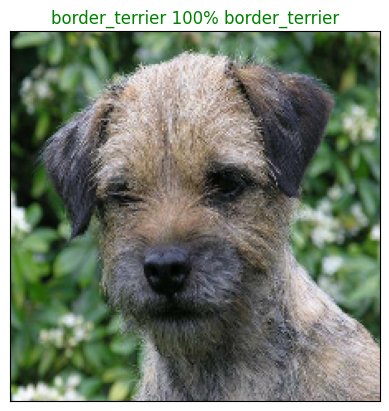

In [91]:
plot_pred(predictions,
          val_labels,
          val_images,
          0)

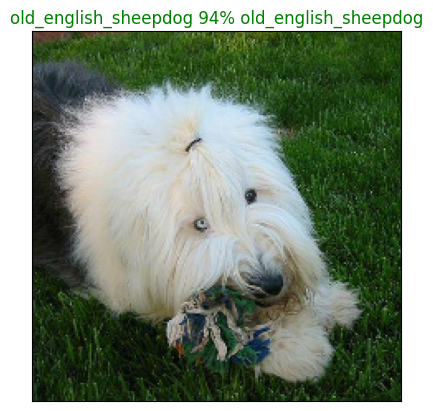

In [93]:
plot_pred(predictions,
          val_labels,
          val_images,
          550)

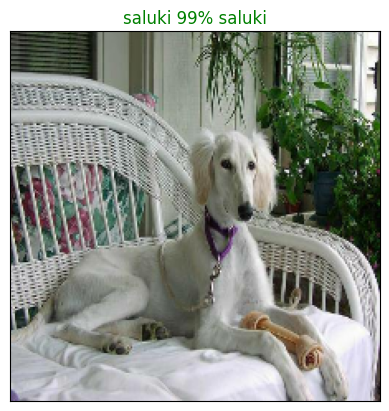

In [94]:
plot_pred(predictions,
          val_labels,
          val_images,
          880)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [95]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Get prediction probabilities indexes
  pred_indexes = np.argsort(pred_prob)[-10:][::-1]
  # Get prediction probabilities labels
  pred_labels = unique_breeds[pred_indexes]
  # Get prediction probabilities values
  pred_vals = pred_prob[pred_indexes]

  # Plot
  top_plot = plt.bar(np.arange(len(pred_labels)),
                     pred_vals,
                     color='red')
  plt.xticks(np.arange(len(pred_labels)),
             pred_labels,
             rotation='vertical')
  # Change color of true label
  if true_label in pred_labels:
    top_plot[np.argmax(pred_labels == true_label)].set_color('green')
  else:
    pass


In [96]:
model.evaluate(val_data, verbose=1)

32/32 [==============================] - 4s 119ms/step - loss: 0.7222 - accuracy: 0.7880


[0.7222315073013306, 0.7879999876022339]

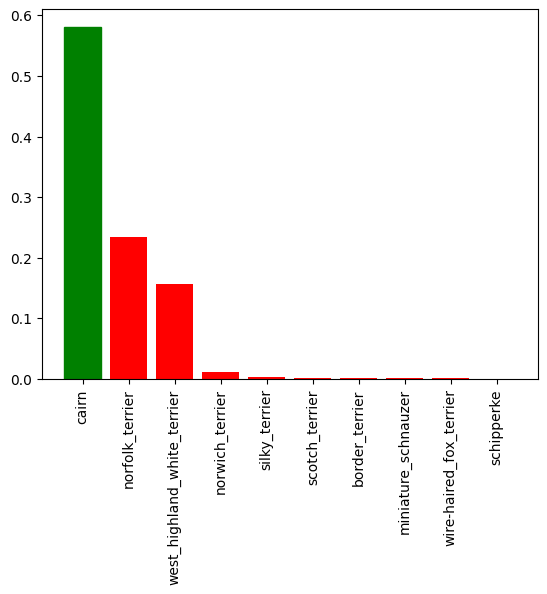

In [97]:
plot_pred_conf(predictions, val_labels, 42)

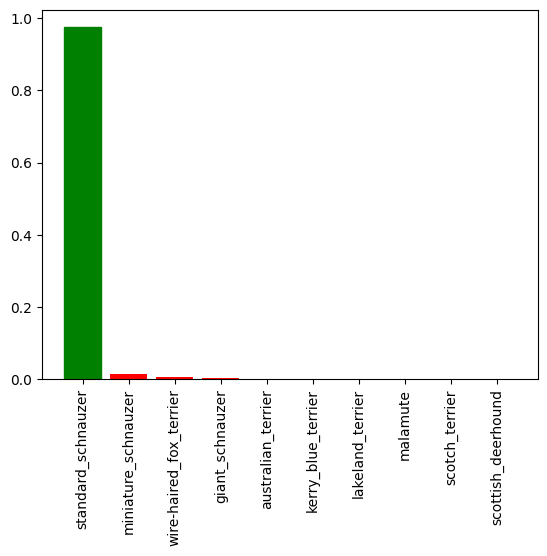

In [98]:
plot_pred_conf(predictions, val_labels, 20)

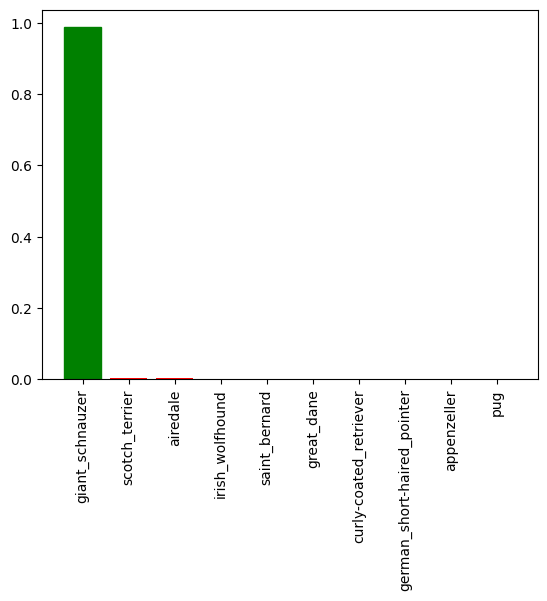

In [99]:
plot_pred_conf(predictions, val_labels, 5)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

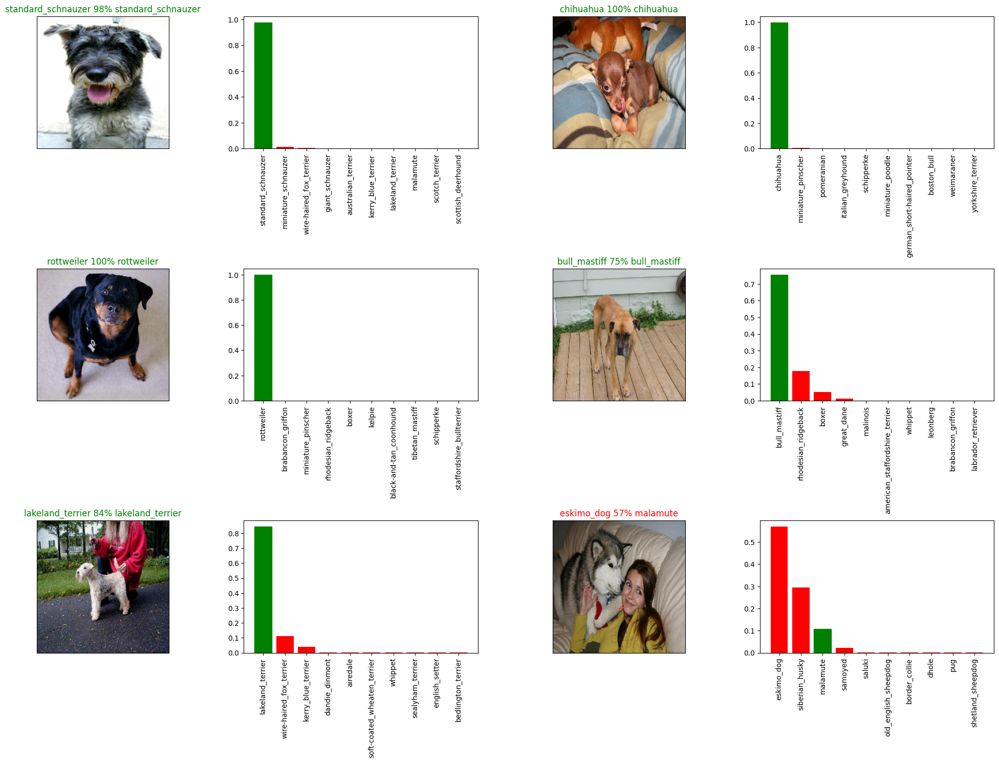

In [100]:
# Let's check out a few predictions and their different values
n_rows = 3
n_cols = 2
i_multiplier = 20
num_images = n_rows * n_cols
fig = plt.figure(figsize=(n_cols * 10, n_rows * 5))
for i in range(num_images):
  plt.subplot(n_rows, n_cols * 2, 2*i+1)
  plot_pred(predictions,
          val_labels,
          val_images,
          i+i_multiplier)
  plt.subplot(n_rows, n_cols * 2, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)


plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [101]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/data-project3/models",
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s')
                          )
  model_path = modeldir + '-' + suffix + '.h5' # Save format of model
  print('model is saving to {}...'.format(model_path))
  model.save(model_path)
  return model_path

In [102]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print('Loading saved model from {}...'.format(model_path))
  loaded_model = tf.keras.models.load_model(model_path,
                                          custom_objects={'KerasLayer': hub.KerasLayer}  # Because our model is not a simple model and is a model from tensorflow hub we wrote this line
                                            )
  return loaded_model

Now we've got functions to save and load a trained model, let's make sure they work!

In [103]:
# Save our model trained on 1000 images
save_model(model, suffix="5000-images-mobilenetv2-Adam(2)")

model is saving to drive/MyDrive/data-project3/models/20250324-11141742814883-5000-images-mobilenetv2-Adam(2).h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/data-project3/models/20250324-11141742814883-5000-images-mobilenetv2-Adam(2).h5'

In [105]:
# Load a trained model
loaded_5000_image_model = load_model('drive/MyDrive/data-project3/models/20250324-11141742814883-5000-images-mobilenetv2-Adam(2).h5')

Loading saved model from drive/MyDrive/data-project3/models/20250324-11141742814883-5000-images-mobilenetv2-Adam(2).h5...


In [106]:
# Evaluate the pre-saved model
model.evaluate(val_data)

32/32 [==============================] - 4s 116ms/step - loss: 0.7222 - accuracy: 0.7880


[0.7222315073013306, 0.7879999876022339]

In [107]:
# Evaluate the loaded model
loaded_5000_image_model.evaluate(val_data)

32/32 [==============================] - 6s 166ms/step - loss: 0.7222 - accuracy: 0.7880


[0.7222315073013306, 0.7879999876022339]

## Training a big dog model 🐶 (on the full data)

In [ ]:
# Let's look at full data splited to X and y
X[:5], y[:5]

(['drive/MyDrive/data-project3/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/data-project3/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/data-project3/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/data-project3/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/data-project3/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_bathes(X, y)

creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                  patience=3)


**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 54s 155ms/step - loss: 1.3438 - accuracy: 0.6700
Epoch 2/100
320/320 [==============================] - 41s 129ms/step - loss: 0.4009 - accuracy: 0.8834
Epoch 3/100
320/320 [==============================] - 48s 151ms/step - loss: 0.2368 - accuracy: 0.9344
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1541 - accuracy: 0.9647
Epoch 5/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1058 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0761 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0600 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0465 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0380 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 41s 127m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

model is saving to drive/MyDrive/data-project3/models/20250324-08391742805598-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/data-project3/models/20250324-08391742805598-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
import tensorflow_hub as hub
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/data-project3/models/20250323-13371742737037-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/data-project3/models/20250323-13371742737037-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
full_model_predictions = full_model.predict(val_data, verbose=1)

7/7 [==============================] - 1s 103ms/step


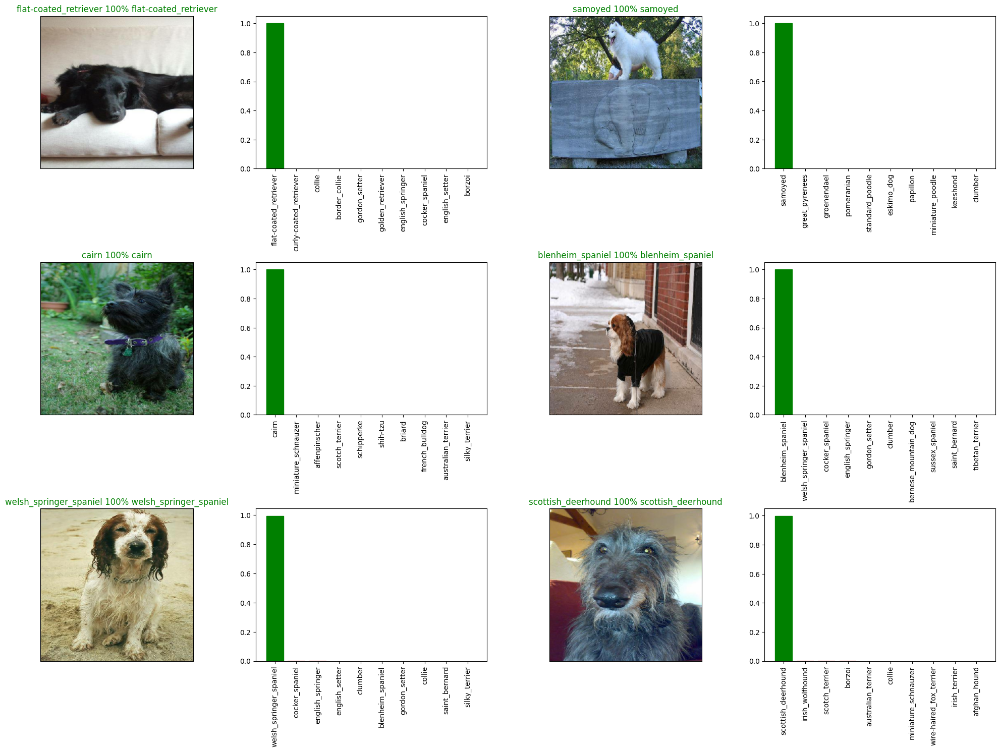

In [ ]:
# Let's check out a few predictions and their different values on Train data of Full model
n_rows = 3
n_cols = 2
i_multiplier = 20
num_images = n_rows * n_cols
fig = plt.figure(figsize=(n_cols * 10, n_rows * 5))
for i in range(num_images):
  plt.subplot(n_rows, n_cols * 2, 2*i+1)
  plot_pred(full_model_predictions,
          val_labels,
          val_images,
          i+i_multiplier)
  plt.subplot(n_rows, n_cols * 2, 2*i+2)
  plot_pred_conf(full_model_predictions, val_labels, i+i_multiplier)


plt.tight_layout(h_pad=1.0)
plt.show()

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = 'drive/MyDrive/data-project3/test/'
test_filenames = [test_path + filename for filename in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/data-project3/test/edcbb82f5b90a8010fed3fa25b632fc3.jpg',
 'drive/MyDrive/data-project3/test/e90d5b1d2617510402f3620721f7c526.jpg',
 'drive/MyDrive/data-project3/test/edd7c1e04601546fc101901d764dc4b4.jpg',
 'drive/MyDrive/data-project3/test/e64d56f012476f124591a22648114a37.jpg',
 'drive/MyDrive/data-project3/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/data-project3/test/ebe58f64e95c071d30eaceb907b7375c.jpg',
 'drive/MyDrive/data-project3/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/MyDrive/data-project3/test/ed7c3126f50898ce02c08a380c1d0bbc.jpg',
 'drive/MyDrive/data-project3/test/f16a73d54d86c0020bf1d63a29eb024b.jpg',
 'drive/MyDrive/data-project3/test/ed3ff512284e226da7ce2853a0faeed7.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_bathes(test_filenames, test_data=True)


creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 250s 755ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/data-project3/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/data-project3/preds_array.csv", delimiter=",")


In [ ]:
test_predictions[:10]

array([[3.48281588e-07, 3.20039507e-14, 1.04136827e-12, ...,
        5.49573538e-12, 2.84487982e-13, 2.29479304e-13],
       [1.19627641e-09, 2.36934118e-11, 1.31995553e-10, ...,
        2.65138652e-07, 7.45135828e-11, 5.60943691e-09],
       [2.21704165e-12, 4.21779367e-09, 1.31741514e-12, ...,
        7.38594386e-09, 6.52908673e-12, 4.09902060e-12],
       ...,
       [9.56839469e-12, 1.10357119e-08, 7.70111960e-11, ...,
        1.73510581e-11, 5.77789715e-13, 3.19573860e-12],
       [3.56870178e-09, 1.62333833e-06, 1.00689924e-07, ...,
        1.08224603e-10, 2.40332909e-08, 8.74052830e-08],
       [4.96778707e-09, 6.82851535e-08, 1.62239977e-09, ...,
        1.14048082e-04, 1.80341841e-09, 3.54750465e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
pandas_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
pandas_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pandas_df['id'] = test_ids

In [ ]:
pandas_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,edcbb82f5b90a8010fed3fa25b632fc3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e90d5b1d2617510402f3620721f7c526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,edd7c1e04601546fc101901d764dc4b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e64d56f012476f124591a22648114a37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7f95aabf775a636b3893ffa120adaf9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
pandas_df[list(unique_breeds)] = test_predictions
pandas_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,edcbb82f5b90a8010fed3fa25b632fc3,3.482816e-07,3.200395e-14,1.041368e-12,3.742342e-13,2.674234e-10,2.365081e-11,1.267823e-12,2.206467e-07,9.051824e-10,...,7.433255e-10,1.788588e-09,2.939658e-12,2.908357e-14,1.556768e-12,1.026930e-11,3.732364e-12,5.495735e-12,2.844880e-13,2.294793e-13
1,e90d5b1d2617510402f3620721f7c526,1.196276e-09,2.369341e-11,1.319956e-10,6.029690e-08,6.323268e-08,4.294003e-05,3.335356e-09,2.786487e-05,1.034344e-11,...,1.408499e-06,4.366790e-03,2.361470e-10,3.547179e-13,4.528637e-09,1.679000e-11,3.963730e-08,2.651387e-07,7.451358e-11,5.609437e-09
2,edd7c1e04601546fc101901d764dc4b4,2.217042e-12,4.217794e-09,1.317415e-12,1.109684e-12,6.306445e-07,1.927805e-08,1.649940e-11,2.823668e-09,6.361915e-15,...,9.073670e-11,6.518528e-14,1.618697e-12,7.177751e-08,5.653488e-10,4.422451e-10,1.115206e-09,7.385944e-09,6.529087e-12,4.099021e-12
3,e64d56f012476f124591a22648114a37,8.904434e-05,8.654712e-11,4.119251e-09,1.102850e-09,1.214376e-08,6.196634e-07,9.403400e-08,1.591106e-06,9.051941e-07,...,3.098200e-07,3.724274e-05,7.919325e-10,2.185578e-09,5.931926e-05,3.887513e-10,1.040684e-03,5.353333e-07,4.485559e-07,1.174997e-08
4,e7f95aabf775a636b3893ffa120adaf9,8.425426e-01,3.130991e-09,1.309658e-08,6.434437e-11,1.303619e-08,1.090771e-10,4.242218e-07,6.466555e-09,1.517894e-09,...,4.954592e-05,3.768755e-07,6.990577e-08,7.124942e-09,1.489186e-08,3.214698e-10,9.393679e-10,4.740822e-10,1.573183e-07,1.183670e-04


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
pandas_df.to_csv('drive/MyDrive/data-project3/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

## This is our ressult in kaggle.com:

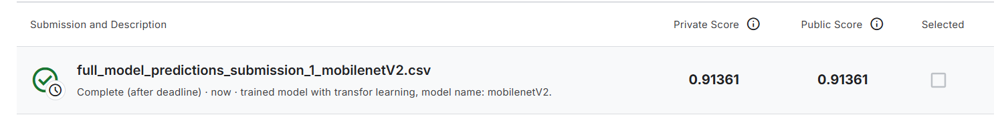